In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
import sys
import os
from utils import load_all_images

TOKENIZER_PATH = '/iopsstor/scratch/cscs/xyixuan/benchmark-image-tokenzier/OpenMAGViT2'
TOKENIZER = "IBQ"
RECONSTRUCTION_PATH = f'/iopsstor/scratch/cscs/xyixuan/benchmark-image-tokenzier/assets/{TOKENIZER}'

sys.path.append(TOKENIZER_PATH)
os.makedirs(RECONSTRUCTION_PATH, exist_ok=True)

In [3]:
# Import everything from your evaluation file
from evaluation_image import *
import matplotlib.pyplot as plt

/users/xyixuan/miniconda3_x86/envs/openmagvit2/lib/python3.8/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [4]:
import torch
import numpy as np
from einops import rearrange
import torch.nn.functional as F
from PIL import Image
import math

In [5]:
from Tiler import Tiler

In [6]:
images, image_names, _ = load_all_images('/iopsstor/scratch/cscs/xyixuan/benchmark-image-tokenzier/assets/original')

Loaded: graph_theory1.png
Loaded: line_chart.png
Loaded: logo1.png
Loaded: logo2.png
Loaded: math_draft1.png
Loaded: menu.jpeg
Loaded: physics1.png
Loaded: physics2.png


In [7]:
# Configuration
model_type = "IBQ"
image_size = 256
DEVICE = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

config_file = "/iopsstor/scratch/cscs/xyixuan/benchmark-image-tokenzier/OpenMAGViT2/configs/IBQ/gpu/imagenet_ibqgan_262144.yaml"  
ckpt_path = "/iopsstor/scratch/cscs/xyixuan/benchmark-image-tokenzier/OpenMAGViT2/upload_ckpts/IBQ/imagenet256_262144.ckpt"
image_folder = "/iopsstor/scratch/cscs/xyixuan/benchmark-image-tokenzier/assets/original"

In [8]:
# Load model
config_model = load_config(config_file, display=False)
model = load_vqgan_new(config_model, model_type, ckpt_path=ckpt_path).to(DEVICE)
print(f"Model device: {next(model.parameters()).device}")

Working with z of shape (1, 256, 16, 16) = 65536 dimensions.


/users/xyixuan/miniconda3_x86/envs/openmagvit2/lib/python3.8/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/users/xyixuan/miniconda3_x86/envs/openmagvit2/lib/python3.8/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG16_Weights.IMAGENET1K_V1`. You can also use `weights=VGG16_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


loaded pretrained LPIPS loss from src/IBQ/modules/autoencoder/lpips/vgg.pth
VQLPIPSWithDiscriminator running with hinge loss.
Model device: cuda:0



Processing image: graph_theory1
Normalized image shape: torch.Size([3, 2100, 1400])
Original image shape: C=3, H=2100, W=1400
Target size: H=2304, W=1536
Padded image shape: torch.Size([3, 2304, 1536])
Number of tiles: H=9, W=6, Total=54
Tiling padded image of shape: C=3, H=2304, W=1536
Tiles grid: 9 rows × 6 columns = 54 total tiles
Tiles shape: torch.Size([54, 3, 256, 256]) (total_tiles, c, th, tw)
Number of tiles: 54
Tile shape: torch.Size([3, 256, 256])
Processing 54 tiles in batches of 8
Processing batch 1/7: tiles 1-8
Processing batch 2/7: tiles 9-16
Processing batch 3/7: tiles 17-24
Processing batch 4/7: tiles 25-32
Processing batch 5/7: tiles 33-40
Processing batch 6/7: tiles 41-48
Processing batch 7/7: tiles 49-54
Encoded codes shape: torch.Size([13824])
Total tokens across all tiles: 13824
Original image pixels: 2940000
Compression ratio: 212.67x
Reconstructed image shape: torch.Size([3, 2100, 1400])
Saved: graph_theory1_tiled_13824.png


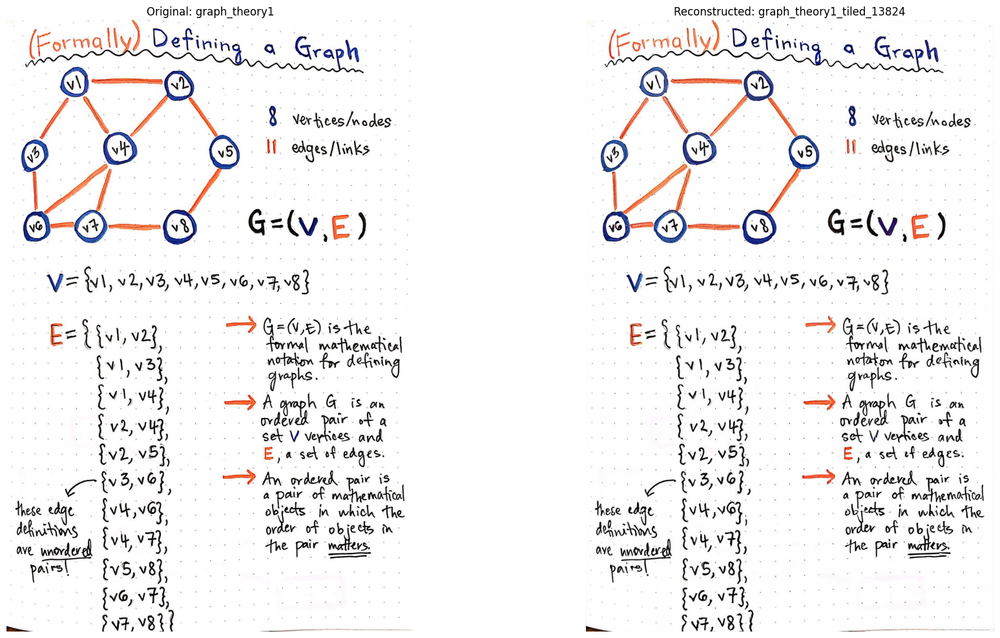

Displaying all tiles in grid:
Showing 9×6 = 54 tiles

Processing image: line_chart
Normalized image shape: torch.Size([3, 626, 712])
Original image shape: C=3, H=626, W=712
Target size: H=768, W=768
Padded image shape: torch.Size([3, 768, 768])
Number of tiles: H=3, W=3, Total=9
Tiling padded image of shape: C=3, H=768, W=768
Tiles grid: 3 rows × 3 columns = 9 total tiles
Tiles shape: torch.Size([9, 3, 256, 256]) (total_tiles, c, th, tw)
Number of tiles: 9
Tile shape: torch.Size([3, 256, 256])
Processing 9 tiles in batches of 8
Processing batch 1/2: tiles 1-8
Processing batch 2/2: tiles 9-9
Encoded codes shape: torch.Size([2304])
Total tokens across all tiles: 2304
Original image pixels: 445712
Compression ratio: 193.45x
Reconstructed image shape: torch.Size([3, 626, 712])
Saved: line_chart_tiled_2304.png


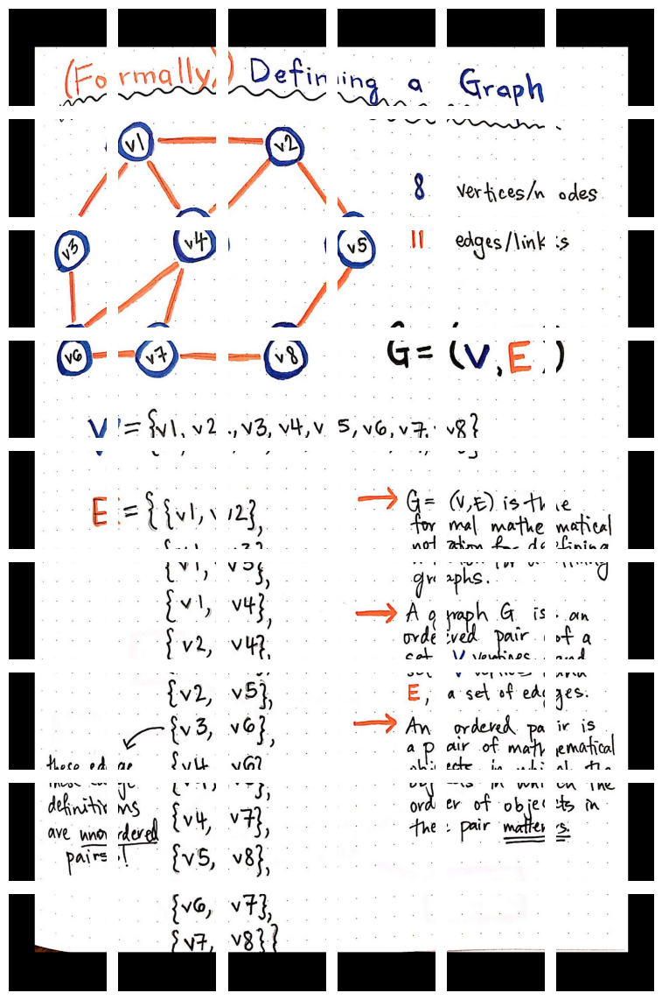

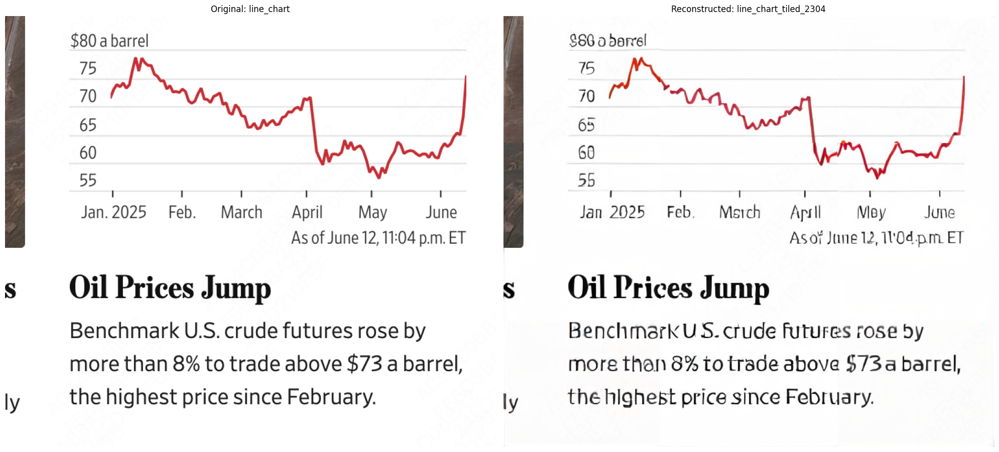

Displaying all tiles in grid:
Showing 3×3 = 9 tiles

Processing image: logo1
Normalized image shape: torch.Size([3, 935, 800])
Original image shape: C=3, H=935, W=800
Target size: H=1024, W=1024
Padded image shape: torch.Size([3, 1024, 1024])
Number of tiles: H=4, W=4, Total=16
Tiling padded image of shape: C=3, H=1024, W=1024
Tiles grid: 4 rows × 4 columns = 16 total tiles
Tiles shape: torch.Size([16, 3, 256, 256]) (total_tiles, c, th, tw)
Number of tiles: 16
Tile shape: torch.Size([3, 256, 256])
Processing 16 tiles in batches of 8
Processing batch 1/2: tiles 1-8
Processing batch 2/2: tiles 9-16
Encoded codes shape: torch.Size([4096])
Total tokens across all tiles: 4096
Original image pixels: 748000
Compression ratio: 182.62x
Reconstructed image shape: torch.Size([3, 935, 800])
Saved: logo1_tiled_4096.png


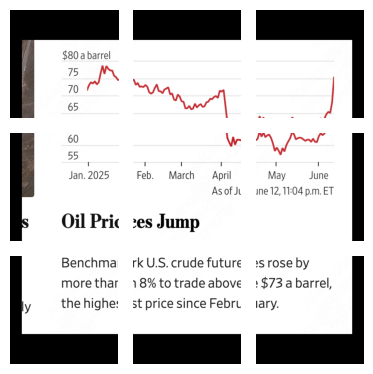

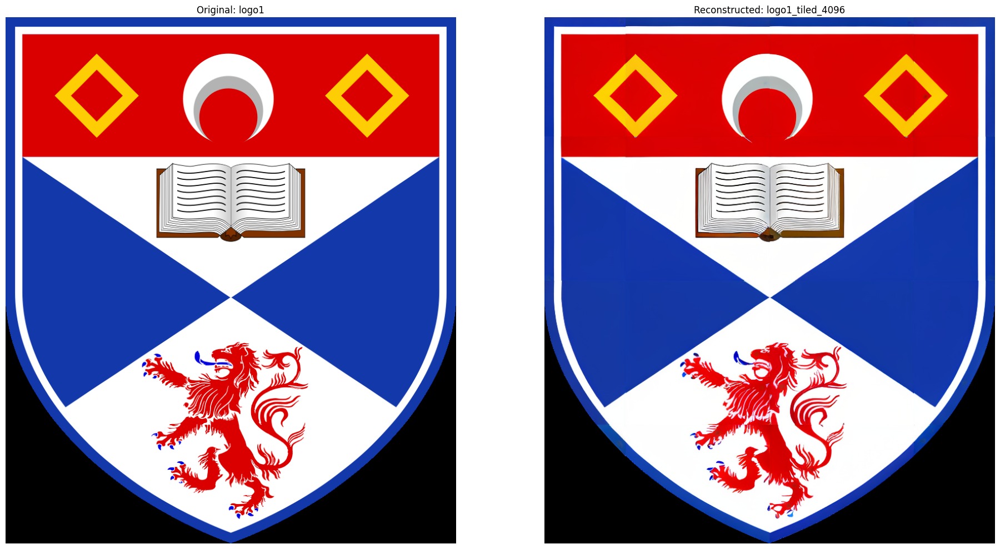

Displaying all tiles in grid:
Showing 4×4 = 16 tiles

Processing image: logo2
Normalized image shape: torch.Size([3, 586, 555])
Original image shape: C=3, H=586, W=555
Target size: H=768, W=768
Padded image shape: torch.Size([3, 768, 768])
Number of tiles: H=3, W=3, Total=9
Tiling padded image of shape: C=3, H=768, W=768
Tiles grid: 3 rows × 3 columns = 9 total tiles
Tiles shape: torch.Size([9, 3, 256, 256]) (total_tiles, c, th, tw)
Number of tiles: 9
Tile shape: torch.Size([3, 256, 256])
Processing 9 tiles in batches of 8
Processing batch 1/2: tiles 1-8
Processing batch 2/2: tiles 9-9
Encoded codes shape: torch.Size([2304])
Total tokens across all tiles: 2304
Original image pixels: 325230
Compression ratio: 141.16x
Reconstructed image shape: torch.Size([3, 586, 555])
Saved: logo2_tiled_2304.png


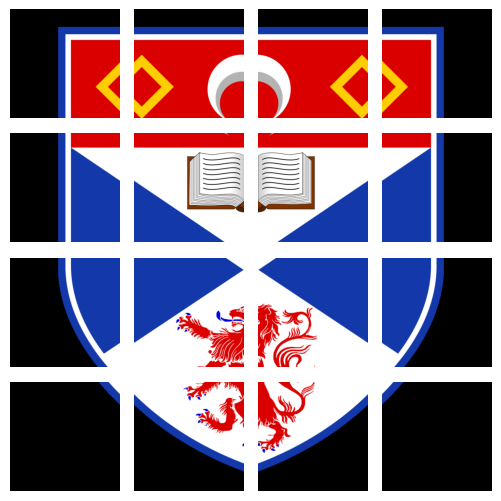

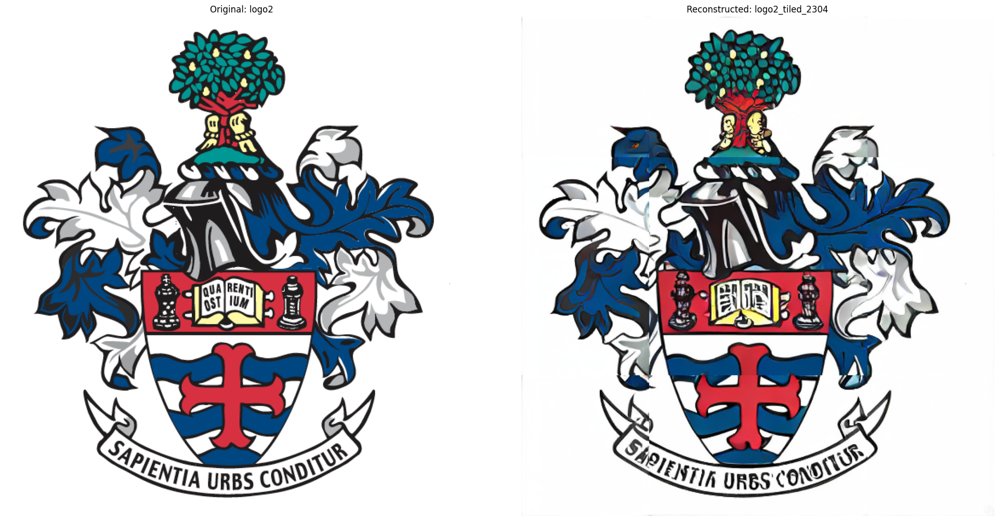

Displaying all tiles in grid:
Showing 3×3 = 9 tiles

Processing image: math_draft1
Normalized image shape: torch.Size([3, 864, 934])
Original image shape: C=3, H=864, W=934
Target size: H=1024, W=1024
Padded image shape: torch.Size([3, 1024, 1024])
Number of tiles: H=4, W=4, Total=16
Tiling padded image of shape: C=3, H=1024, W=1024
Tiles grid: 4 rows × 4 columns = 16 total tiles
Tiles shape: torch.Size([16, 3, 256, 256]) (total_tiles, c, th, tw)
Number of tiles: 16
Tile shape: torch.Size([3, 256, 256])
Processing 16 tiles in batches of 8
Processing batch 1/2: tiles 1-8
Processing batch 2/2: tiles 9-16
Encoded codes shape: torch.Size([4096])
Total tokens across all tiles: 4096
Original image pixels: 806976
Compression ratio: 197.02x
Reconstructed image shape: torch.Size([3, 864, 934])
Saved: math_draft1_tiled_4096.png


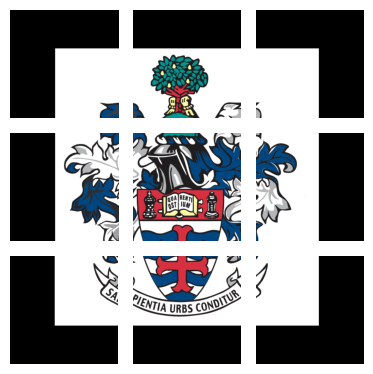

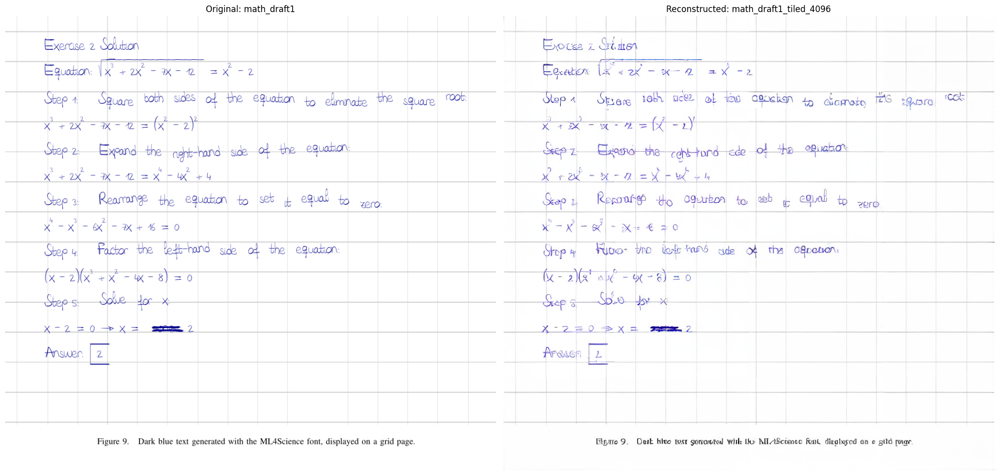

Displaying all tiles in grid:
Showing 4×4 = 16 tiles

Processing image: menu
Normalized image shape: torch.Size([3, 2048, 1536])
Original image shape: C=3, H=2048, W=1536
Target size: H=2048, W=1536
Padded image shape: torch.Size([3, 2048, 1536])
Number of tiles: H=8, W=6, Total=48
Tiling padded image of shape: C=3, H=2048, W=1536
Tiles grid: 8 rows × 6 columns = 48 total tiles
Tiles shape: torch.Size([48, 3, 256, 256]) (total_tiles, c, th, tw)
Number of tiles: 48
Tile shape: torch.Size([3, 256, 256])
Processing 48 tiles in batches of 8
Processing batch 1/6: tiles 1-8
Processing batch 2/6: tiles 9-16
Processing batch 3/6: tiles 17-24
Processing batch 4/6: tiles 25-32
Processing batch 5/6: tiles 33-40
Processing batch 6/6: tiles 41-48
Encoded codes shape: torch.Size([12288])
Total tokens across all tiles: 12288
Original image pixels: 3145728
Compression ratio: 256.00x
Reconstructed image shape: torch.Size([3, 2048, 1536])
Saved: menu_tiled_12288.png


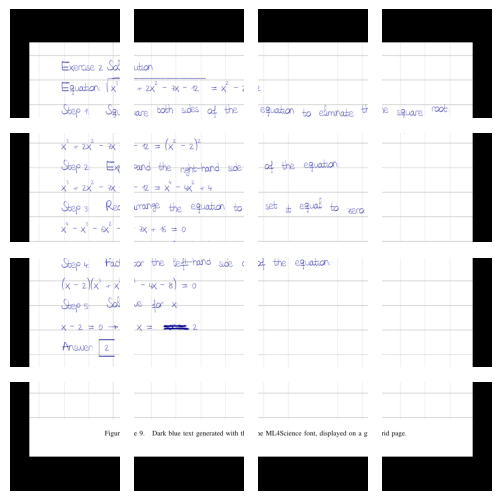

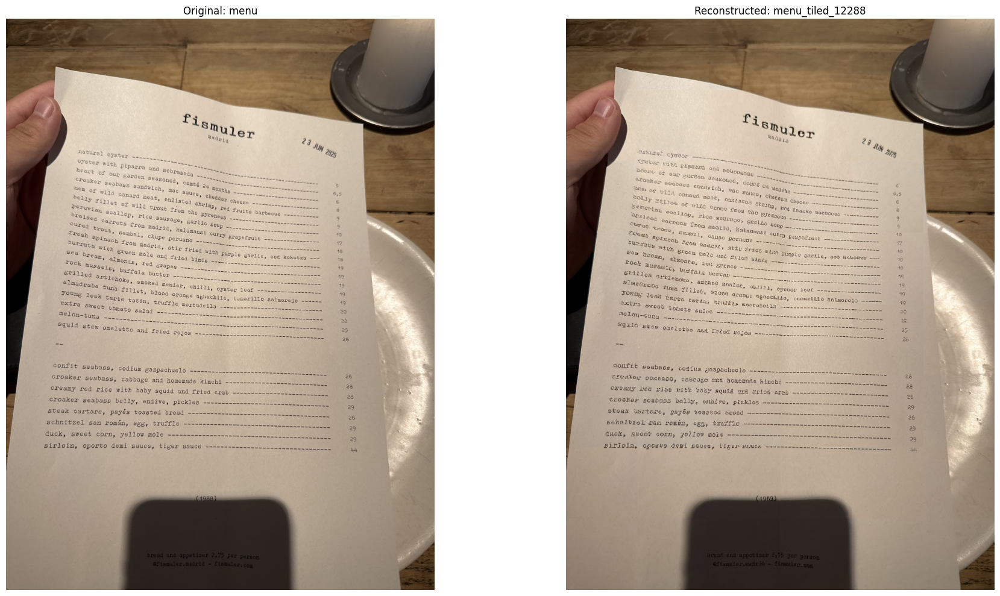

Displaying all tiles in grid:
Showing 8×6 = 48 tiles

Processing image: physics1
Normalized image shape: torch.Size([3, 270, 527])
Original image shape: C=3, H=270, W=527
Target size: H=512, W=768
Padded image shape: torch.Size([3, 512, 768])
Number of tiles: H=2, W=3, Total=6
Tiling padded image of shape: C=3, H=512, W=768
Tiles grid: 2 rows × 3 columns = 6 total tiles
Tiles shape: torch.Size([6, 3, 256, 256]) (total_tiles, c, th, tw)
Number of tiles: 6
Tile shape: torch.Size([3, 256, 256])
Processing 6 tiles in batches of 8
Processing batch 1/1: tiles 1-6
Encoded codes shape: torch.Size([1536])
Total tokens across all tiles: 1536
Original image pixels: 142290
Compression ratio: 92.64x
Reconstructed image shape: torch.Size([3, 270, 527])
Saved: physics1_tiled_1536.png


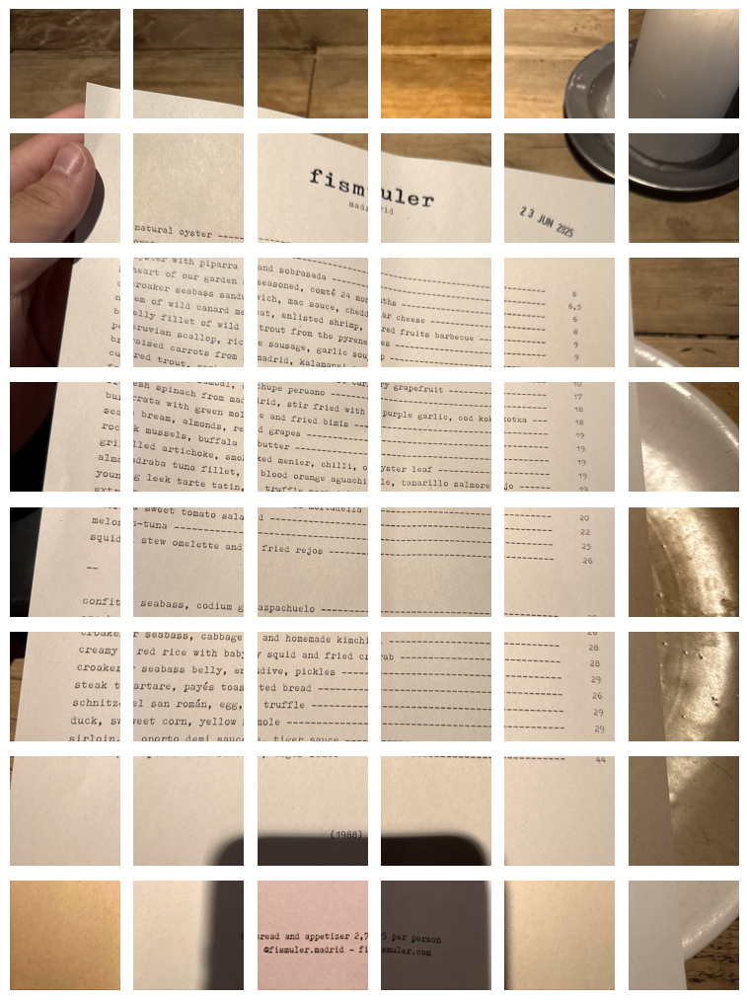

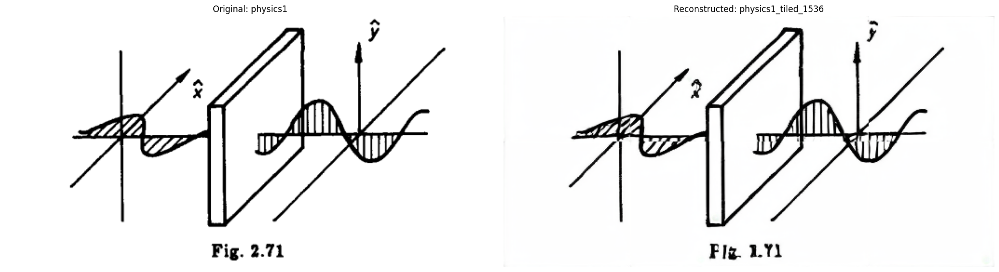

Displaying all tiles in grid:
Showing 2×3 = 6 tiles

Processing image: physics2
Normalized image shape: torch.Size([3, 341, 651])
Original image shape: C=3, H=341, W=651
Target size: H=512, W=768
Padded image shape: torch.Size([3, 512, 768])
Number of tiles: H=2, W=3, Total=6
Tiling padded image of shape: C=3, H=512, W=768
Tiles grid: 2 rows × 3 columns = 6 total tiles
Tiles shape: torch.Size([6, 3, 256, 256]) (total_tiles, c, th, tw)
Number of tiles: 6
Tile shape: torch.Size([3, 256, 256])
Processing 6 tiles in batches of 8
Processing batch 1/1: tiles 1-6
Encoded codes shape: torch.Size([1536])
Total tokens across all tiles: 1536
Original image pixels: 221991
Compression ratio: 144.53x
Reconstructed image shape: torch.Size([3, 341, 651])
Saved: physics2_tiled_1536.png


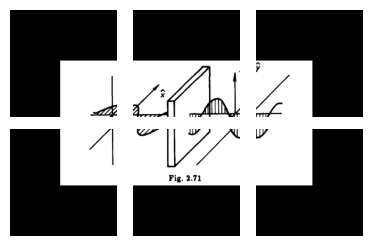

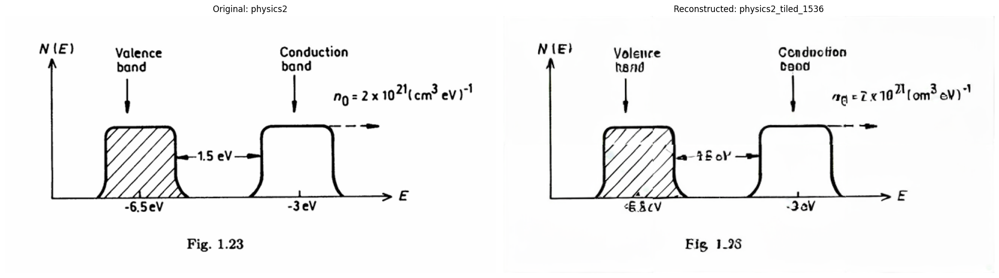

Displaying all tiles in grid:
Showing 2×3 = 6 tiles


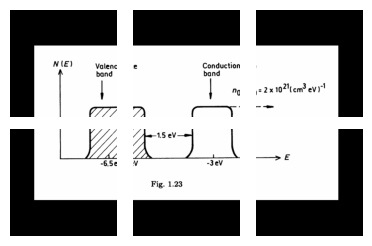

In [13]:
import os
from PIL import Image
import torch
import numpy as np
import matplotlib.pyplot as plt

# Assuming you have the Tiler class imported
# from your_tiler_module import Tiler

# Create reconstruction directory if it doesn't exist
os.makedirs(RECONSTRUCTION_PATH, exist_ok=True)

# Initialize tiler for normalized values
tiler = Tiler(tile_size=256, pad_value=-1.0)

# Process each image
with torch.no_grad():
    for image, name in zip(images, image_names):
        print(f"\nProcessing image: {name}")
        
        # Convert to tensor (matching the exact preprocessing from ImagePaths)
        if not image.mode == "RGB":
            image = image.convert("RGB")
        
        # Convert to numpy and normalize exactly like in ImagePaths.preprocess_image
        image_np = np.array(image)
        image_np = (image_np/127.5 - 1.0).astype(np.float32)

        # Convert to tensor (CHW format, no batch dimension yet)
        image_tensor = torch.from_numpy(image_np).permute(2, 0, 1)
        print(f"Normalized image shape: {image_tensor.shape}")
        
        # Tile the normalized image
        result = tiler(image_tensor)
        tiles = result['tiles']  # Shape: (total_tiles, C, tile_h, tile_w)
        metadata = result['metadata']
        
        print(f"Number of tiles: {tiles.shape[0]}")
        print(f"Tile shape: {tiles.shape[1:]}")
        
        # Process tiles in batches to avoid OOM
        batch_size = 8  # Adjust this based on your GPU memory
        total_tiles = tiles.shape[0]
        reconstructed_tiles_list = []
        all_indices = []
        
        print(f"Processing {total_tiles} tiles in batches of {batch_size}")
        
        for i in range(0, total_tiles, batch_size):
            end_idx = min(i + batch_size, total_tiles)
            batch_tiles = tiles[i:end_idx].to(DEVICE)
            
            print(f"Processing batch {i//batch_size + 1}/{(total_tiles + batch_size - 1)//batch_size}: tiles {i+1}-{end_idx}")
            
            # Process this batch through the model
            # Using IBQ API: quant, qloss, (_, _, indices) = model.encode(images)
            if model.use_ema:
                with model.ema_scope():
                    quant, qloss, (_, _, indices) = model.encode(batch_tiles)
                    reconstructed_batch = model.decode(quant)
            else:
                quant, qloss, (_, _, indices) = model.encode(batch_tiles)
                reconstructed_batch = model.decode(quant)
            
            # Clamp and move to CPU to save GPU memory
            reconstructed_batch = reconstructed_batch.clamp(-1, 1).cpu()
            reconstructed_tiles_list.append(reconstructed_batch)
            all_indices.append(indices.cpu())
            
            # Clear GPU memory
            del batch_tiles, quant, reconstructed_batch, indices
            torch.cuda.empty_cache()
        
        # Concatenate all results
        reconstructed_tiles = torch.cat(reconstructed_tiles_list, dim=0)
        all_indices_tensor = torch.cat(all_indices, dim=0)
        
        print(f"Encoded codes shape: {all_indices_tensor.shape}")
        
        # Calculate tokens and compression ratio
        total_tokens = all_indices_tensor.numel()
        original_pixels = image_tensor.shape[-2] * image_tensor.shape[-1]
        compression_ratio = original_pixels / total_tokens
        
        print(f"Total tokens across all tiles: {total_tokens}")
        print(f"Original image pixels: {original_pixels}")
        print(f"Compression ratio: {compression_ratio:.2f}x")
        
        # Reconstruct full image from tiles
        reconstructed_full = tiler.full_reconstruct(reconstructed_tiles, metadata)
        
        print(f"Reconstructed image shape: {reconstructed_full.shape}")
        
        # Convert to PIL for display and saving
        original_pil = custom_to_pil(image_tensor.cpu())
        reconstructed_pil = custom_to_pil(reconstructed_full.cpu())
        
        # Create filename with token count
        name_without_ext = os.path.splitext(name)[0]
        output_filename = f"{name_without_ext}_tiled_{total_tokens}.png"
        output_path = os.path.join(RECONSTRUCTION_PATH, output_filename)
        
        # Save the reconstructed image
        reconstructed_pil.save(output_path)
        print(f"Saved: {output_filename}")
        
        # Show results
        fig, axes = plt.subplots(1, 2, figsize=(20, 10))
        
        # Original image
        axes[0].imshow(original_pil)
        axes[0].set_title(f"Original: {name}")
        axes[0].axis('off')
        
        # Reconstructed image
        axes[1].imshow(reconstructed_pil)
        axes[1].set_title(f"Reconstructed: {name_without_ext}_tiled_{total_tokens}")
        axes[1].axis('off')
        
        plt.tight_layout()
        plt.show()
        
        # Show all tiles in grid format
        print("Displaying all tiles in grid:")
        tiler.show_tiles(tiles.cpu(), metadata)
        
        # break  # Remove this to process all images

In [11]:
# # Process each image
# with torch.no_grad():
#     for image, name in zip(images, image_names):
#         print(f"\nProcessing image: {name}")
        
#         # Convert to tensor (matching the exact preprocessing from ImagePaths)
#         if not image.mode == "RGB":
#             image = image.convert("RGB")
        
#         # Convert to numpy and normalize exactly like in ImagePaths.preprocess_image
#         image_np = np.array(image)
#         image_np = (image_np/127.5 - 1.0).astype(np.float32)

#         # Convert to tensor (CHW format, no batch dimension yet)
#         image_tensor = torch.from_numpy(image_np).permute(2, 0, 1)
#         print(f"Normalized image shape: {image_tensor.shape}")
        
#         # Add batch dimension and move to device
#         image_batch = image_tensor.unsqueeze(0).to(DEVICE)
#         print(f"Input image shape: {image_batch.shape}")
        
#         # Encode/decode (using your exact original pipeline)
#         images_padded, crop_region = pad_images(image_batch)
        
#         if model.use_ema:
#             with model.ema_scope():
#                 quant, qloss, (_, _, indices) = model.encode(images_padded)
#                 reconstructed_original = model.decode(quant)
#         else:
#             quant, qloss, (_, _, indices) = model.encode(images_padded)
#             reconstructed_original = model.decode(quant)
        
#         print(f"Encoded codes shape: {indices.shape}")
        
#         # Calculate tokens and compression ratio for original
#         original_tokens = indices.numel()
#         original_pixels = image_tensor.shape[-2] * image_tensor.shape[-1]
#         original_compression_ratio = original_pixels / original_tokens
        
#         print(f"Original method tokens: {original_tokens}")
#         print(f"Original image pixels: {original_pixels}")
#         print(f"Original compression ratio: {original_compression_ratio:.2f}x")
        
#         reconstructed_original = reconstructed_original.clamp(-1, 1)
#         reconstructed_original = unpad_images(reconstructed_original, crop_region)

#         # Convert to PIL for display and saving
#         original_pil = custom_to_pil(image_tensor.cpu())
#         reconstructed_original_pil = custom_to_pil(reconstructed_original.squeeze(0).cpu())
        
#         # Create filename with token count
#         name_without_ext = os.path.splitext(name)[0]
#         output_filename = f"{name_without_ext}_original_{original_tokens}.png"
#         output_path = os.path.join(RECONSTRUCTION_PATH, output_filename)
        
#         # Save the reconstructed image
#         reconstructed_original_pil.save(output_path)
#         print(f"Saved: {output_filename}")

#         # Show results
#         fig, axes = plt.subplots(1, 2, figsize=(20, 10))
        
#         # Original image
#         axes[0].imshow(original_pil)
#         axes[0].set_title(f"Original: {name}")
#         axes[0].axis('off')
        
#         # Reconstructed image
#         axes[1].imshow(reconstructed_original_pil)
#         axes[1].set_title(f"Reconstructed: {name_without_ext}_{original_tokens}")
#         axes[1].axis('off')
        
#         plt.tight_layout()
#         plt.show()